# **Covid-19, Pneumonia classification**

![alt text](https://3.bp.blogspot.com/-SaNFu07Nx2Y/UZQxFjhcKBI/AAAAAAAAF2c/i-iNpYe6nzQ/s1600/Enfisema+Pulmonar.jpg)

### Problem Statement
* **In this case study, we will assume that you work as a Deep Learning Consultant.**
* **You have been hired by a hospital in downtown Toronto and you have been tasked with automate the process of detecting and classifying chest disease and reducing the cost and time of detection.**
* **The team has collected extensive X-Ray chest data and they approached you to develop a model that could detect and classify the diseases in less than 1 minute.**
* **You have been provided with 133 images that belong to 4 classes:**
    * _Healthy_
    * _Covid-19_
    * _Bacterial Pneumonia_
    * _Viral Pneumonia_

##  Import Libraries

In [1]:
# for analysis dataset
import pandas as pd
import numpy as np
# for visualization
import matplotlib.pyplot as plt
import seaborn as sns
# for preprocessing
from tensorflow.keras.preprocessing.image import ImageDataGenerator
# for building CNN model
import tensorflow as tf
import os
import cv2
from tensorflow.keras import layers, optimizers
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import (Input,
                                     Add,
                                     Dense,
                                     Activation,
                                     ZeroPadding2D,
                                     BatchNormalization,
                                     Flatten,
                                     AveragePooling2D,
                                     MaxPool2D,
                                     Dropout,
                                     Conv2D)
from tensorflow.keras.models import Model, load_model
from tensorflow.keras import backend as K
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping, ModelCheckpoint, LearningRateScheduler
from tensorflow.keras.applications.resnet50 import ResNet50
from keras.applications.vgg19 import VGG19
from tensorflow.keras.applications.vgg16 import VGG16
# for scoring
from sklearn.metrics import (confusion_matrix,
                             ConfusionMatrixDisplay,
                             classification_report,
                             precision_recall_fscore_support, 
                             accuracy_score,
                             f1_score)

## Functions for visualization

In [2]:
# view some images
def visualization_plot(x_dir, x):
    
    plt.figure(figsize= (25, 15))
    
    for i in range(16):
        plt.subplot(4,4, i + 1)
        img = plt.imread(os.path.join(x_dir, x[i]))
        plt.imshow(img, cmap='gray')
        plt.axis('off')  
    plt.tight_layout()

In [3]:
# visualize loss and accuracy history
def history_plot(history):
    loss = np.array(history.history['loss'])
    val_loss = np.array(history.history['val_loss'])
    accuracy = np.array(history.history['accuracy'])
    val_accuracy = np.array(history.history['val_accuracy'])
    epochs = range(len(history.history['loss']))
    
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))
    # plot loss
    ax1.plot(epochs, loss, label='training_loss', marker='o')
    ax1.plot(epochs, val_loss, label='val_loss', marker='o')
    ax1.set_title('Loss', fontsize=16)
    ax1.set_xlabel('Epochs', fontsize=12)
    ax1.legend()
    # plot accuracy
    ax2.plot(epochs, accuracy, label='training_accuracy', marker='o')
    ax2.plot(epochs, val_accuracy, label='val_accuracy', marker='o')
    ax2.set_title('Accuracy', fontsize=16)
    ax2.set_xlabel('Epochs', fontsize=12)
    ax2.legend()

In [4]:
# visualize verification of prediction
def predictive_plot(prediction, original):
    train_images, train_labels = next(train_generator)
    label_names = {0: 'Covid-19', 1: 'Normal', 2: 'Viral Pneumonia', 3: 'Bacterical Pneumonia'}
    
    L = 5
    W = 5

    fig,axes= plt.subplots(L,W, figsize=(12,12))
    axes = axes.ravel()

    for i in np.arange(0,L*W):
         axes[i].imshow(image[i])
         axes[i].set_title('Guess={}\nTrue={}'.format(label_names[prediction[i]], str(label_names[original[i]])))
         axes[i].axis('off')
    plt.subplots_adjust(wspace=1.2)

In [5]:
# confution matrix and classification report
def metrics(original,prediction):
    # classification report
    print(classification_report(np.asarray(original), np.asarray(prediction)))
    print('**'*50)
    # accuracy of our model
    score = accuracy_score(original,prediction)
    print('Test accuracy: {}'.format(score))
    print('**'*50)
    # confusion matrix
    cm = confusion_matrix(np.asarray(original), np.asarray(prediction))
    labels = ["Covid","Normal","Viral Pneumonia","Bacterical Pneumonia"]
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=labels)
    disp.plot(cmap=plt.cm.RdPu)
    plt.figure(figsize=(10, 10))
    plt.show()

## Load the dataset

In [6]:
# file path to required folders
train_dir= '../X-ray_dataset/train'
test_dir = '../X-ray_dataset/test'

In [7]:
# file path to required folders by class
normal = os.listdir('../X-ray_dataset/train/1')
normal_dir = '../X-ray_dataset/train/1'
covid = os.listdir('../X-ray_dataset/train/0')
covid_dir = '../X-ray_dataset/train/0'
viralPneumonia = os.listdir('../X-ray_dataset/train/2')
viralPneumonia_dir = '../X-ray_dataset/train/2'
bactericalPneumonia = os.listdir('../X-ray_dataset/train/3')
bactericalPneumonia_dir = '../X-ray_dataset/train/3'

 ##  Data Analysis

In [8]:
# see folder contents
print("Train set:")
print(f"Covid= {len(covid)}")
print(f"Normal= {len(normal)}")
print(f"Viral Pneumonia= {len(viralPneumonia)}")
print(f"Bacterical Pneumonia= {len(bactericalPneumonia)}")
print("***************************\nTest set:")
print(f"Covid = {len(os.listdir(os.path.join(test_dir, '0')))}")
print(f"Normal = {len(os.listdir(os.path.join(test_dir, '1')))}")
print(f"Viral Pneumonia= {len(os.listdir(os.path.join(test_dir, '2')))}")
print(f"Bacterical Pneumonia= {len(os.listdir(os.path.join(test_dir, '3')))}")

Train set:
Covid= 133
Normal= 133
Viral Pneumonia= 133
Bacterical Pneumonia= 133
***************************
Test set:
Covid = 10
Normal = 10
Viral Pneumonia= 10
Bacterical Pneumonia= 10


<AxesSubplot:>

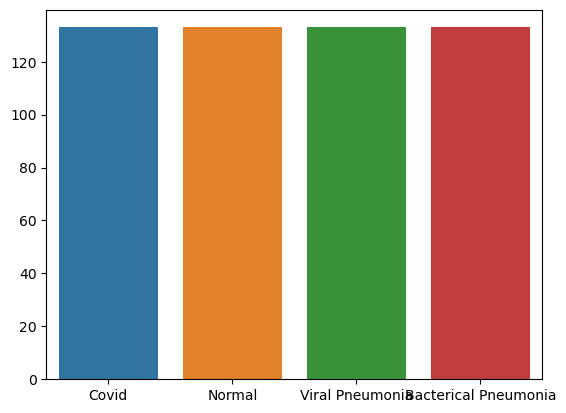

In [9]:
# view the distribution of the labels
sns.barplot(x=["Covid","Normal","Viral Pneumonia","Bacterical Pneumonia"],
            y=[len(covid),len(normal),len(viralPneumonia),len(bactericalPneumonia)])

Distribution of class labels is the same

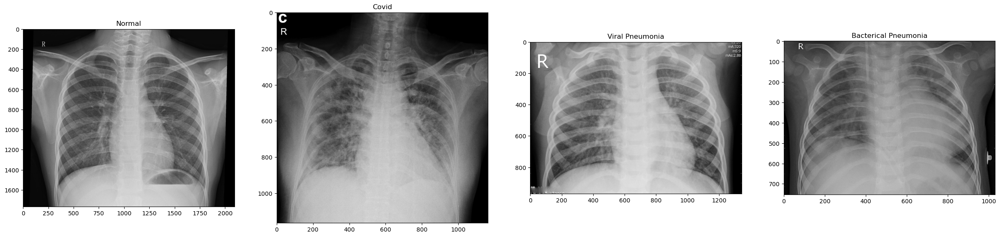

In [10]:
# sample image from each label
normal_img = os.listdir('../X-ray_dataset/train/1')[3]
covid_img = os.listdir('../X-ray_dataset/train/0')[5]
viral_img = os.listdir('../X-ray_dataset/train/2')[18]
bacteric_img = os.listdir('../X-ray_dataset/train/3')[9]

plt.figure(figsize= (30, 40))
plt.subplot(1,4,1)
img1 = plt.imread(os.path.join(normal_dir, normal_img))
plt.title('Normal')
plt.imshow(img1,cmap='gray')
plt.subplot(1,4,2)
img2 = plt.imread(os.path.join(covid_dir, covid_img))
plt.title('Covid')
plt.imshow(img2,cmap='gray')
plt.subplot(1,4,3)
img3 = plt.imread(os.path.join(viralPneumonia_dir, viral_img))
plt.title('Viral Pneumonia')
plt.imshow(img3,cmap='gray')
plt.subplot(1,4,4)
img4 = plt.imread(os.path.join(bactericalPneumonia_dir, bacteric_img))
plt.title('Bacterical Pneumonia')
plt.imshow(img4,cmap='gray')

* Coronavirus disease 2019 (COVID-19) is a contagious disease caused by a virus, the severe acute respiratory syndrome coronavirus 2 (SARS-CoV-2). [link from wikipedia](https://en.wikipedia.org/wiki/COVID-19)
* Viral pneumonia is a pneumonia caused by a virus. The pulmonary alveoli fill with fluid or pus making it difficult to breathe. [link from wikipedia](https://en.wikipedia.org/wiki/Viral_pneumonia)
* Bacterial pneumonia is a type of pneumonia caused by bacterial infection.  Often, bacteria live in parts of the upper respiratory tract and are continuously being inhaled into the alveoli, the cavities deep in the lungs where gas exchange takes place. [link from wikipedia](https://en.wikipedia.org/wiki/Bacterial_pneumonia)

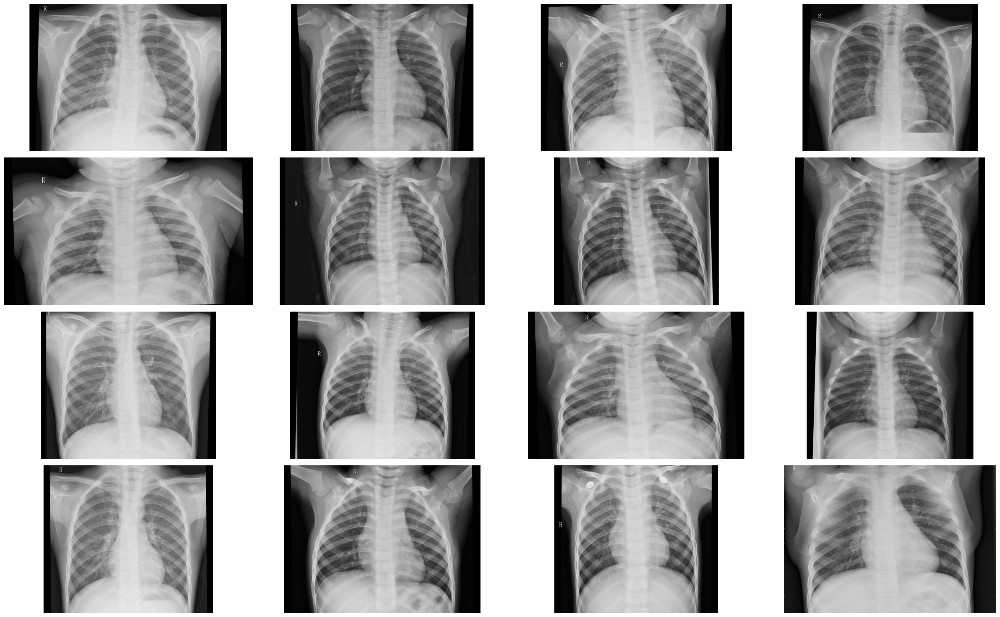

In [11]:
# let's see 16 random images of healthy lungs
visualization_plot(normal_dir, normal)

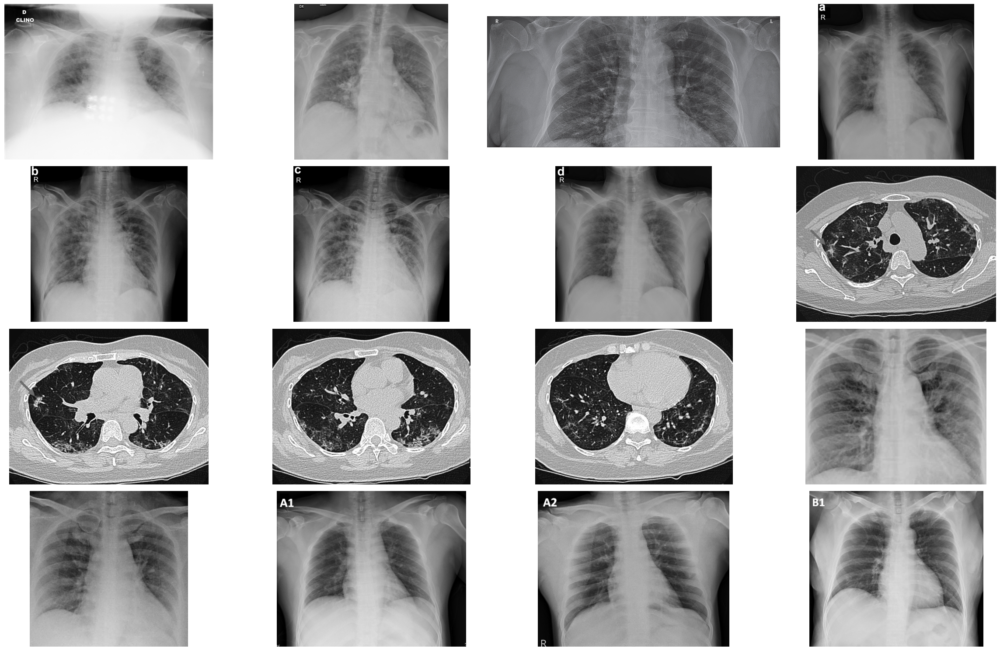

In [12]:
# let's see 16 random images of Covid-infected lungs
visualization_plot(covid_dir, covid)

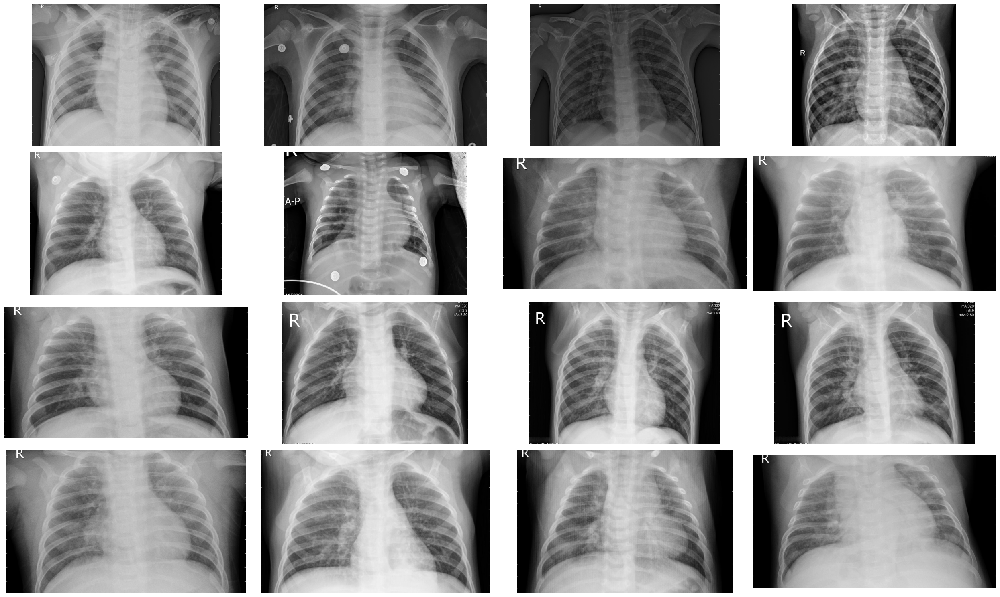

In [13]:
# let's see 16 random images of viral pneumonia
visualization_plot(viralPneumonia_dir, viralPneumonia)

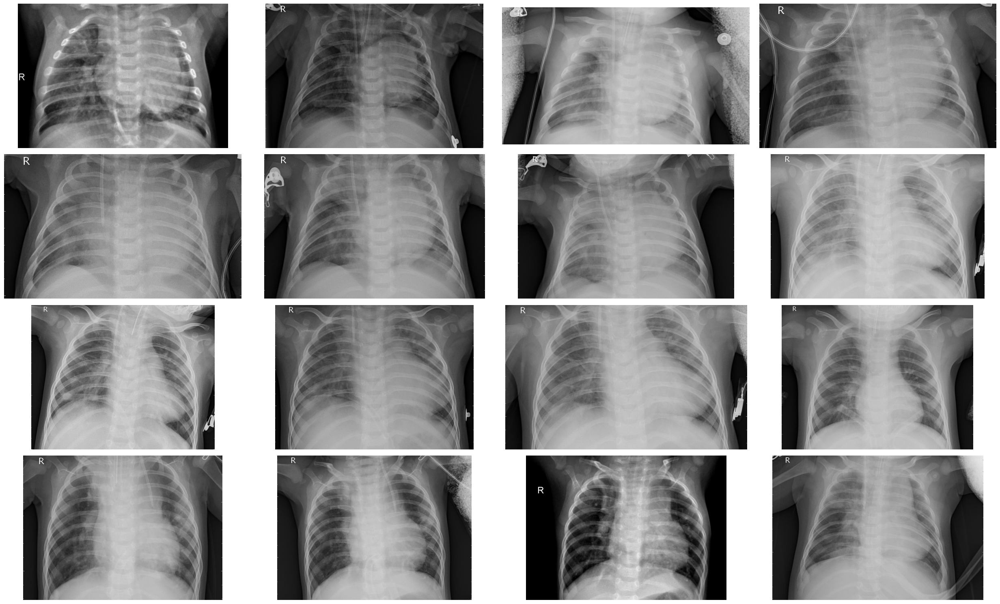

In [14]:
# let's see 16 random images of bacterical pneumonia
visualization_plot(bactericalPneumonia_dir, bactericalPneumonia)

The dimensions of the image are 1526 pixels in height and 2035 pixels in width 
The maximum pixel value : 255.0000. The minimum pixel value: 0.0000
The mean value of the pixels : 140.3045
The standard deviation : 63.9231


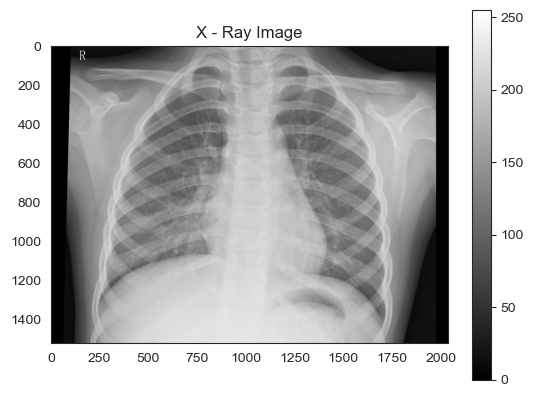

In [20]:
# analysis of a single image
normal_img = os.listdir('../X-ray_dataset/train/1')[0]
img = plt.imread(os.path.join(normal_dir, normal_img))
plt.imshow(img, cmap='gray')
plt.colorbar()
plt.title('X - Ray Image')

print(f"The dimensions of the image are {img.shape[0]} pixels in height and {img.shape[1]} pixels in width ")
print(f"The maximum pixel value : {img.max():.4f}. The minimum pixel value: {img.min():.4f}")
print(f"The mean value of the pixels : {img.mean():.4f}")
print(f"The standard deviation : {img.std():.4f}")

Text(0, 0.5, '#Pixels in Image')

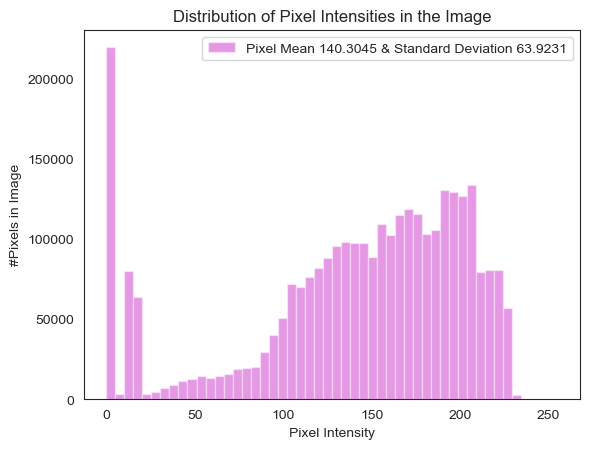

In [21]:
# pixel value distribution
sns.distplot(img.ravel(),
             label=f"Pixel Mean {np.mean(img):.4f} & Standard Deviation {np.std(img):.4f}", 
             kde=False,
             color= 'm')
plt.legend(loc='upper right')
plt.title('Distribution of Pixel Intensities in the Image')
plt.xlabel('Pixel Intensity')
plt.ylabel('#Pixels in Image')

We can see that the distribution of pixels is from 0 to 250. The distribution is skewed.

## Data Preprocessing

In [17]:
# preparing images for CNN
train_gen = ImageDataGenerator(rescale= 1./255, validation_split=0.2)
test_gen = ImageDataGenerator(rescale=1./25)

# getting the images in batches and scaling them
train_generator = train_gen.flow_from_directory(
    batch_size= 40,
    directory = train_dir,
    shuffle= True,
    target_size = (256,256),
    class_mode = 'categorical',
    subset = 'training'
)

validation_generator = train_gen.flow_from_directory(
    batch_size=40,
    directory= train_dir,
    shuffle= True,
    target_size= (256,256),
    class_mode = 'categorical',
    subset = 'validation'
)

test_generator = test_gen.flow_from_directory(
    batch_size=10,
    directory= test_dir,
    shuffle= True,
    target_size=(256,256),
    class_mode= 'categorical'
)

Found 428 images belonging to 4 classes.
Found 104 images belonging to 4 classes.
Found 40 images belonging to 4 classes.


The dimensions of the image are 256 pixels in height and 256 pixels in width
The maximum pixel : 1.0000. The minimum : 0.0000
The mean value of the pixels : 0.4940
The standard deviation : 0.2489


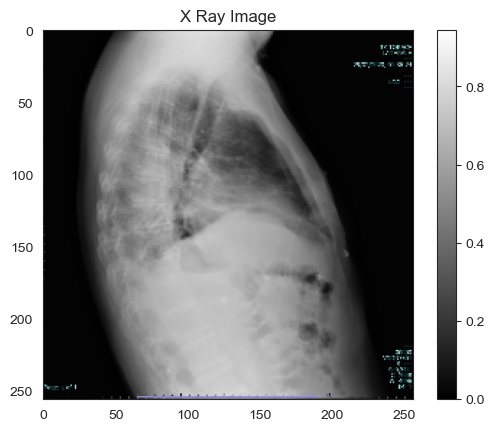

In [18]:
# analysis of a single image after image generation
sns.set_style('white')
image, label = train_generator.__getitem__(0)
plt.imshow(image[0], cmap='gray')
plt.colorbar()
plt.title('X Ray Image')

print(f"The dimensions of the image are {image.shape[1]} pixels in height and {image.shape[2]} pixels in width")
print(f"The maximum pixel : {image.max():.4f}. The minimum : {image.min():.4f}")
print(f"The mean value of the pixels : {image.mean():.4f}")
print(f"The standard deviation : {image.std():.4f}")

Text(0, 0.5, '# Pixels in Image')

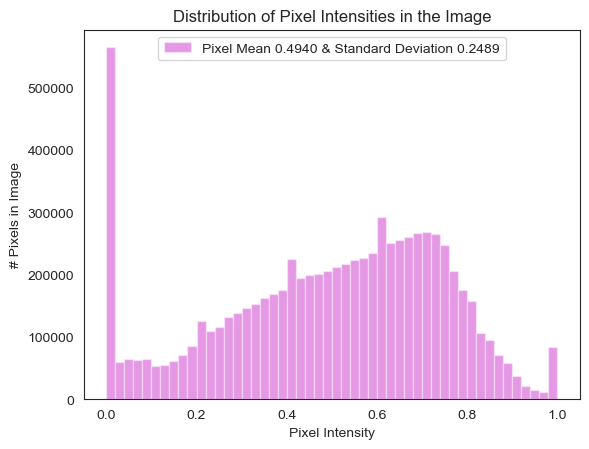

In [19]:
# pixel value distribution after image generation
sns.distplot(image.ravel(),
             label=f"Pixel Mean {np.mean(image):.4f} & Standard Deviation {np.std(image):.4f}", 
             kde=False,
             color= 'm')
plt.legend(loc='upper center')
plt.title('Distribution of Pixel Intensities in the Image')
plt.xlabel('Pixel Intensity')
plt.ylabel('# Pixels in Image')

After generating the image, the distribution of pixels went from 0 to 1. The distribution became closer to normal.

## CNN model building (1st version)

In [118]:
# creating convolutional neural networks - CNNs
model= Sequential()
model.add(Conv2D(filters=128,strides= 2, kernel_size = (3,3), activation='relu', input_shape=(256,256,3,)))
model.add(MaxPool2D(2,2))
model.add(Conv2D(filters=64,kernel_size = (3,3),activation='relu'))
model.add(MaxPool2D(2,2))
model.add(Conv2D(filters=30,kernel_size = (3,3),activation='relu'))
model.add(MaxPool2D(2,2))
model.add(Flatten())
# fully connected layer
model.add(Dense(248,activation='relu'))
model.add(Dense(112,activation='relu'))
model.add(Dropout(0.2))
model.add(Dense(56,activation='relu'))
model.add(Dense(64,activation='relu'))
model.add(Dropout(0.2))
model.add(Dense(32,activation='relu'))
model.add(Dropout(0.2))
model.add(Dense(4,activation = 'softmax'))
# compile the model
model.compile(loss = 'categorical_crossentropy', optimizer ='adam', metrics= ['accuracy'])
model.summary()

Model: "sequential_10"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_30 (Conv2D)          (None, 127, 127, 128)     3584      
                                                                 
 max_pooling2d_30 (MaxPoolin  (None, 63, 63, 128)      0         
 g2D)                                                            
                                                                 
 conv2d_31 (Conv2D)          (None, 61, 61, 64)        73792     
                                                                 
 max_pooling2d_31 (MaxPoolin  (None, 30, 30, 64)       0         
 g2D)                                                            
                                                                 
 conv2d_32 (Conv2D)          (None, 28, 28, 30)        17310     
                                                                 
 max_pooling2d_32 (MaxPoolin  (None, 14, 14, 30)     

In [119]:
# checkpointer to monitor accuracy and preventing overfit
earlystopping = EarlyStopping(
    monitor = 'val_loss',
    mode = 'min',
    verbose = 1,
    patience = 20
)
# save the weights
checkpointer = ModelCheckpoint(
    filepath = 'cnn1.hdf5',
    verbose = 1,
    save_best_only = True
)

In [120]:
# train the model
history_cnn_1 = model.fit(
    train_generator,
    epochs = 100,
    validation_data = validation_generator,
    callbacks = [earlystopping, checkpointer]
)

Epoch 1/100
11/11 [==============================] - ETA: 0s - loss: 1.3925 - accuracy: 0.2991
Epoch 1: val_loss improved from inf to 1.39060, saving model to cnn1.hdf5
11/11 [==============================] - 15s 1s/step - loss: 1.3925 - accuracy: 0.2991 - val_loss: 1.3906 - val_accuracy: 0.2500
Epoch 2/100
11/11 [==============================] - ETA: 0s - loss: 1.3859 - accuracy: 0.2804
Epoch 2: val_loss improved from 1.39060 to 1.38413, saving model to cnn1.hdf5
11/11 [==============================] - 14s 1s/step - loss: 1.3859 - accuracy: 0.2804 - val_loss: 1.3841 - val_accuracy: 0.2500
Epoch 3/100
11/11 [==============================] - ETA: 0s - loss: 1.3821 - accuracy: 0.2664
Epoch 3: val_loss improved from 1.38413 to 1.37965, saving model to cnn1.hdf5
11/11 [==============================] - 14s 1s/step - loss: 1.3821 - accuracy: 0.2664 - val_loss: 1.3797 - val_accuracy: 0.2500
Epoch 4/100
11/11 [==============================] - ETA: 0s - loss: 1.3772 - accuracy: 0.2991
Epo

Epoch 30/100
11/11 [==============================] - ETA: 0s - loss: 0.1372 - accuracy: 0.9579
Epoch 30: val_loss did not improve from 0.55730
11/11 [==============================] - 14s 1s/step - loss: 0.1372 - accuracy: 0.9579 - val_loss: 0.7287 - val_accuracy: 0.8558
Epoch 31/100
11/11 [==============================] - ETA: 0s - loss: 0.1495 - accuracy: 0.9533
Epoch 31: val_loss did not improve from 0.55730
11/11 [==============================] - 15s 1s/step - loss: 0.1495 - accuracy: 0.9533 - val_loss: 0.8965 - val_accuracy: 0.7788
Epoch 32/100
11/11 [==============================] - ETA: 0s - loss: 0.1235 - accuracy: 0.9650
Epoch 32: val_loss did not improve from 0.55730
11/11 [==============================] - 14s 1s/step - loss: 0.1235 - accuracy: 0.9650 - val_loss: 0.9764 - val_accuracy: 0.7788
Epoch 33/100
11/11 [==============================] - ETA: 0s - loss: 0.2469 - accuracy: 0.9322
Epoch 33: val_loss did not improve from 0.55730
11/11 [==============================

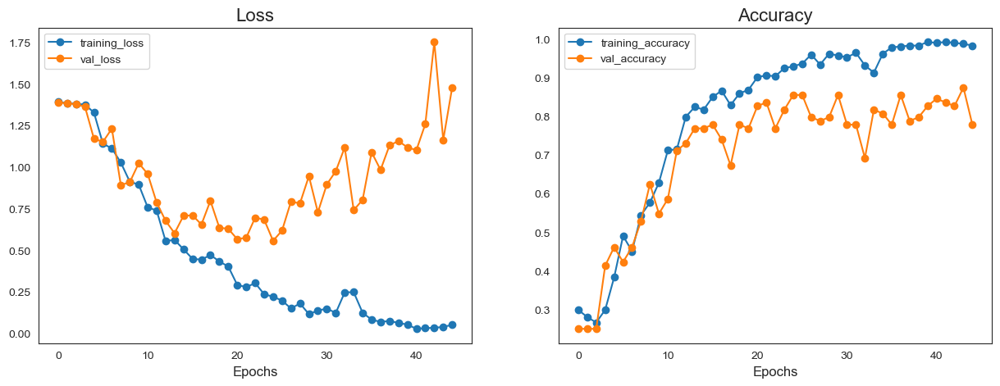

In [121]:
# visualize loss and accuracy history
history_plot(history_cnn_1)

 We observe overfitting after 11 epoch on the training set.

In [122]:
# model evaluation
evaluate = model.evaluate(test_generator, steps= test_generator.n//10, verbose=1)
print('Accuracy test {}'.format(evaluate[1]))
model.save('X-ray_cnn_1.h5')

4/4 [==============================] - 1s 146ms/step - loss: 12.8048 - accuracy: 0.7500
Accuracy test0.75


In [123]:
# generate model predictions
prediction_cnn_1=[]
original_cnn_1= []
image= []

for i in range(len(os.listdir(test_dir))):
    for item in os.listdir(os.path.join(test_dir, str(i))):
        img = cv2.imread(os.path.join(test_dir, str(i), item))
        img = cv2.resize(img, (256,256))
        image.append(img)

        img = img /255
        img = img.reshape(-1,256,256,3)

        predict = model.predict(img)
        predict = np.argmax(predict)
        prediction_cnn_1.append(predict)
        original_cnn_1.append(i)

1/1 [==============================] - 0s 27ms/step


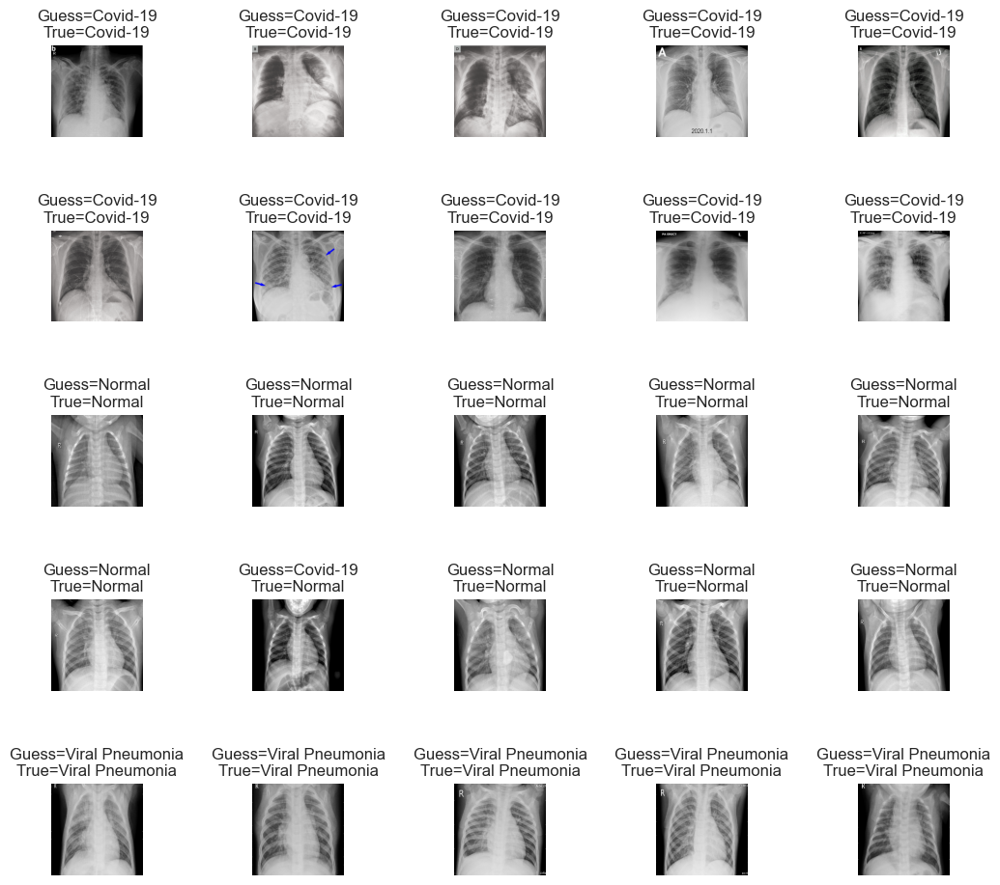

In [124]:
# plot the images and check with results
predictive_plot(prediction_cnn_1, original_cnn_1)

We took 25 random images to predict the model, and only once the model was wrong.

              precision    recall  f1-score   support

           0       0.83      1.00      0.91        10
           1       0.82      0.90      0.86        10
           2       0.70      0.70      0.70        10
           3       1.00      0.70      0.82        10

    accuracy                           0.82        40
   macro avg       0.84      0.82      0.82        40
weighted avg       0.84      0.82      0.82        40

****************************************************************************************************
Test accuracy: 0.825
****************************************************************************************************


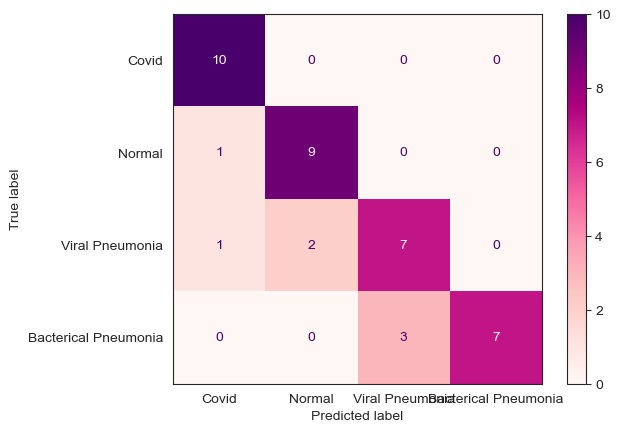

<Figure size 1000x1000 with 0 Axes>

In [125]:
# let's have a look at the classification report and confution matrix
metrics(np.asarray(original_cnn_1), np.asarray(prediction_cnn_1))

## CNN model building (2nd version)

In [330]:
# creating convolutional neural networks - CNNs
model_cnn2= Sequential()
model_cnn2.add(Conv2D(filters=128,strides= 2, kernel_size = (3,3), activation='relu', input_shape=(256,256,3,)))
model_cnn2.add(MaxPool2D(2,2))
model_cnn2.add(Conv2D(filters=64,kernel_size = (3,3),activation='relu'))
model_cnn2.add(MaxPool2D(2,2))
model_cnn2.add(Conv2D(filters=30,kernel_size = (3,3),activation='relu'))
model_cnn2.add(MaxPool2D(2,2))
model_cnn2.add(Flatten())
# fully connected layer
model_cnn2.add(Dense(248,activation='relu'))
model_cnn2.add(Dense(112,activation='relu'))
model_cnn2.add(Dropout(0.2))
model_cnn2.add(Dense(56,activation='relu'))
model_cnn2.add(Dense(64,activation='relu'))
model_cnn2.add(Dropout(0.2))
model_cnn2.add(Dense(32,activation='relu'))
model_cnn2.add(Dropout(0.7))
model_cnn2.add(Dense(4,activation = 'softmax'))
# compile the model
model_cnn2.compile(loss = 'categorical_crossentropy', optimizer ='Adamax', metrics= ['accuracy'])
model_cnn2.summary()

Model: "sequential_27"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_81 (Conv2D)          (None, 127, 127, 128)     3584      
                                                                 
 max_pooling2d_83 (MaxPoolin  (None, 63, 63, 128)      0         
 g2D)                                                            
                                                                 
 conv2d_82 (Conv2D)          (None, 61, 61, 64)        73792     
                                                                 
 max_pooling2d_84 (MaxPoolin  (None, 30, 30, 64)       0         
 g2D)                                                            
                                                                 
 conv2d_83 (Conv2D)          (None, 28, 28, 30)        17310     
                                                                 
 max_pooling2d_85 (MaxPoolin  (None, 14, 14, 30)     

In [331]:
# checkpointer to monitor accuracy and preventing overfit
earlystopping = EarlyStopping(
    monitor = 'val_loss',
    mode = 'min',
    verbose = 1,
    patience = 20
)
# save the weights
checkpointer = ModelCheckpoint(
    filepath = 'cnn2.hdf5',
    verbose = 1,
    save_best_only = True
)

In [332]:
# train the model
history_cnn_2 = model_cnn2.fit(
    train_generator,
    epochs = 100,
    validation_data = validation_generator,
    callbacks = [earlystopping, checkpointer]
)

Epoch 1/100
11/11 [==============================] - ETA: 0s - loss: 1.3963 - accuracy: 0.2710
Epoch 1: val_loss improved from inf to 1.38571, saving model to cnn2.hdf5
11/11 [==============================] - 15s 1s/step - loss: 1.3963 - accuracy: 0.2710 - val_loss: 1.3857 - val_accuracy: 0.2500
Epoch 2/100
11/11 [==============================] - ETA: 0s - loss: 1.3861 - accuracy: 0.2570
Epoch 2: val_loss did not improve from 1.38571
11/11 [==============================] - 14s 1s/step - loss: 1.3861 - accuracy: 0.2570 - val_loss: 1.3858 - val_accuracy: 0.2500
Epoch 3/100
11/11 [==============================] - ETA: 0s - loss: 1.3866 - accuracy: 0.2383
Epoch 3: val_loss improved from 1.38571 to 1.38558, saving model to cnn2.hdf5
11/11 [==============================] - 14s 1s/step - loss: 1.3866 - accuracy: 0.2383 - val_loss: 1.3856 - val_accuracy: 0.2500
Epoch 4/100
11/11 [==============================] - ETA: 0s - loss: 1.3864 - accuracy: 0.2640
Epoch 4: val_loss did not improve 

Epoch 29/100
11/11 [==============================] - ETA: 0s - loss: 0.6579 - accuracy: 0.7523
Epoch 29: val_loss improved from 0.69638 to 0.63687, saving model to cnn2.hdf5
11/11 [==============================] - 14s 1s/step - loss: 0.6579 - accuracy: 0.7523 - val_loss: 0.6369 - val_accuracy: 0.7788
Epoch 30/100
11/11 [==============================] - ETA: 0s - loss: 0.7044 - accuracy: 0.7079
Epoch 30: val_loss improved from 0.63687 to 0.63214, saving model to cnn2.hdf5
11/11 [==============================] - 15s 1s/step - loss: 0.7044 - accuracy: 0.7079 - val_loss: 0.6321 - val_accuracy: 0.7981
Epoch 31/100
11/11 [==============================] - ETA: 0s - loss: 0.6397 - accuracy: 0.7593
Epoch 31: val_loss improved from 0.63214 to 0.59380, saving model to cnn2.hdf5
11/11 [==============================] - 14s 1s/step - loss: 0.6397 - accuracy: 0.7593 - val_loss: 0.5938 - val_accuracy: 0.7596
Epoch 32/100
11/11 [==============================] - ETA: 0s - loss: 0.6439 - accuracy:

Epoch 58/100
11/11 [==============================] - ETA: 0s - loss: 0.3288 - accuracy: 0.8808
Epoch 58: val_loss did not improve from 0.42019
11/11 [==============================] - 14s 1s/step - loss: 0.3288 - accuracy: 0.8808 - val_loss: 0.4983 - val_accuracy: 0.8077
Epoch 59/100
11/11 [==============================] - ETA: 0s - loss: 0.2997 - accuracy: 0.8902
Epoch 59: val_loss did not improve from 0.42019
11/11 [==============================] - 15s 1s/step - loss: 0.2997 - accuracy: 0.8902 - val_loss: 0.4530 - val_accuracy: 0.8269
Epoch 60/100
11/11 [==============================] - ETA: 0s - loss: 0.3037 - accuracy: 0.8902
Epoch 60: val_loss did not improve from 0.42019
11/11 [==============================] - 14s 1s/step - loss: 0.3037 - accuracy: 0.8902 - val_loss: 0.4512 - val_accuracy: 0.8654
Epoch 61/100
11/11 [==============================] - ETA: 0s - loss: 0.3414 - accuracy: 0.8692
Epoch 61: val_loss did not improve from 0.42019
11/11 [==============================

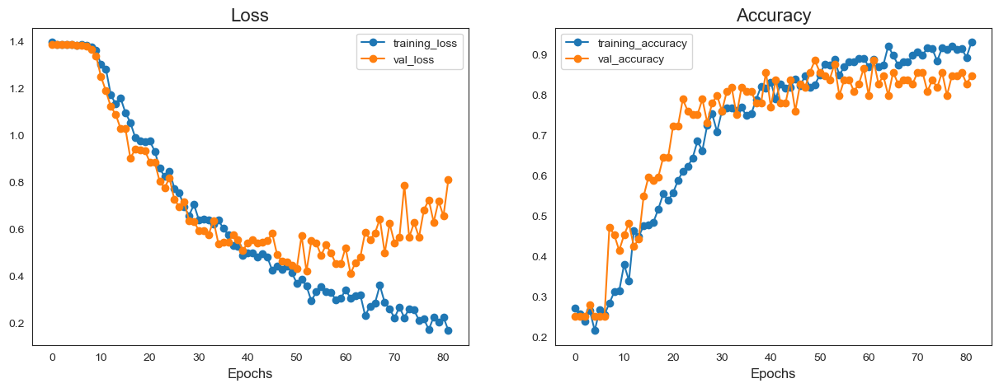

In [333]:
# visualize loss and accuracy history
history_plot(history_cnn_2)

 We observe overfitting after 51 epochs on the training set.

In [334]:
# model evaluation
evaluate_cnn_2 = model_cnn2.evaluate(test_generator, steps= test_generator.n//10, verbose=1)
print('Accuracy test{}'.format(evaluate_cnn_2[1]))
model_cnn2.save('X-ray_cnn_2.h5')

4/4 [==============================] - 1s 173ms/step - loss: 21.7157 - accuracy: 0.7250
Accuracy test0.7250000238418579


In [335]:
# generate model predictions
prediction_cnn_2=[]
original_cnn_2= []
image= []

for i in range(len(os.listdir(test_dir))):
    for item in os.listdir(os.path.join(test_dir, str(i))):
        img = cv2.imread(os.path.join(test_dir, str(i), item))
        img = cv2.resize(img, (256,256))
        image.append(img)

        img = img /255
        img = img.reshape(-1,256,256,3)

        predict = model_cnn2.predict(img)
        predict = np.argmax(predict)
        prediction_cnn_2.append(predict)
        original_cnn_2.append(i)

1/1 [==============================] - 0s 28ms/step


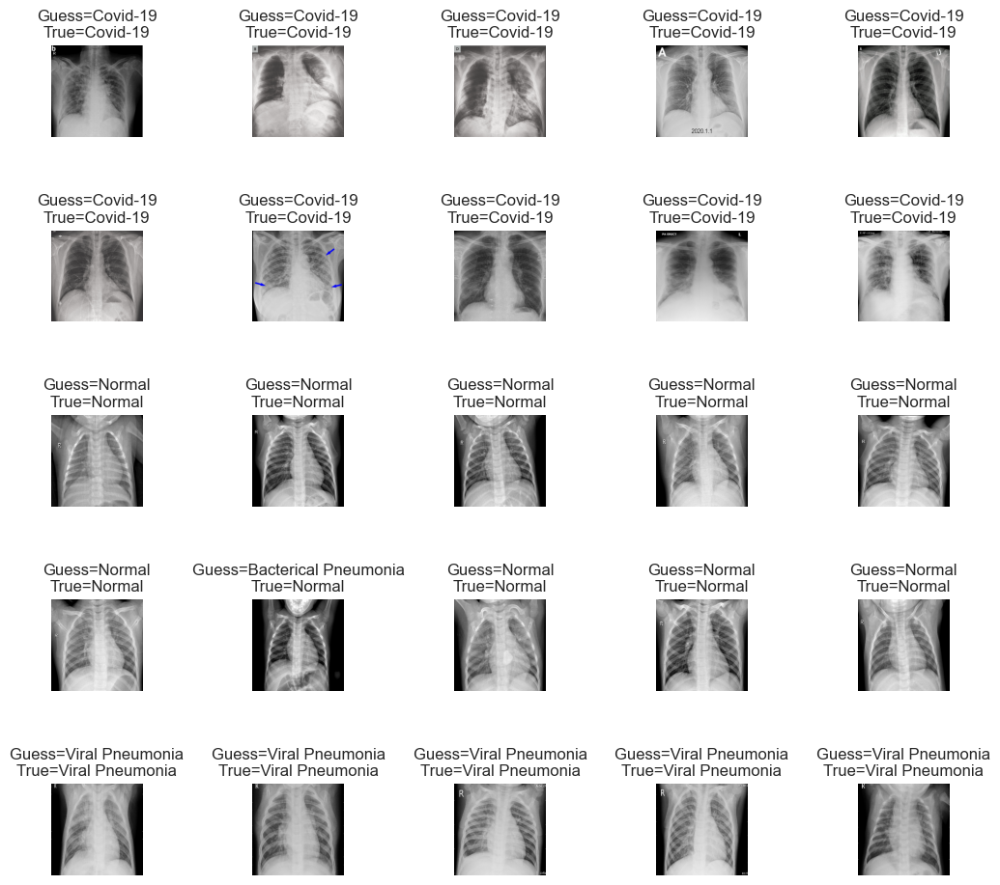

In [336]:
# plot the images and check with results
predictive_plot(prediction_cnn_2, original_cnn_2)

We took 25 random images to predict the model, and only once the model was wrong.

              precision    recall  f1-score   support

           0       0.83      1.00      0.91        10
           1       0.69      0.90      0.78        10
           2       0.70      0.70      0.70        10
           3       0.80      0.40      0.53        10

    accuracy                           0.75        40
   macro avg       0.76      0.75      0.73        40
weighted avg       0.76      0.75      0.73        40

****************************************************************************************************
Test accuracy: 0.75
****************************************************************************************************


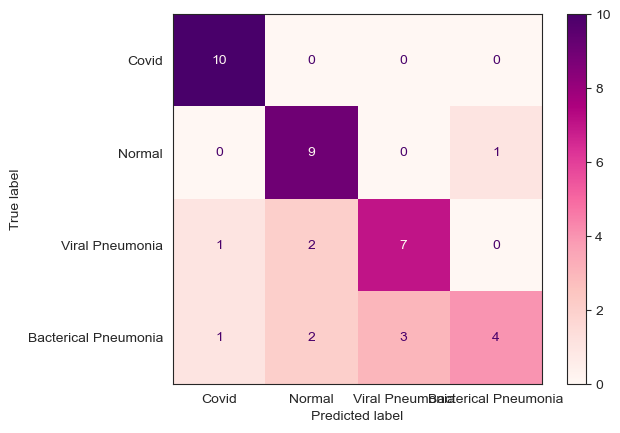

<Figure size 1000x1000 with 0 Axes>

In [337]:
# let's have a look at the classification report and confution matrix
metrics(np.asarray(original_cnn_2), np.asarray(prediction_cnn_2))

## Residual Network model building (ResNet50)

  ResNet stands for Residual Network and is a specific type of convolutional neural network (CNN) introduced in the 2015 paper “Deep Residual Learning for Image Recognition” by He Kaiming, Zhang Xiangyu, Ren Shaoqing, and Sun Jian. CNNs are commonly used to power computer vision applications.
  In order to solve the problem of the vanishing gradient, this architecture introduced the concept called Residual Blocks. The skip connection connects activations of a  layer to further layers by skipping some layers in between. This forms a residual block. Resnets are made by stacking these residual blocks together. 

  _Each ResNet block is either 2 layer deep (Used in small networks like ResNet 18, 34) or 3 layer deep( ResNet 50, 101, 152)._ [link](https://medium.com/@14prakash/understanding-and-implementing-architectures-of-resnet-and-resnext-for-state-of-the-art-image-cf51669e1624)
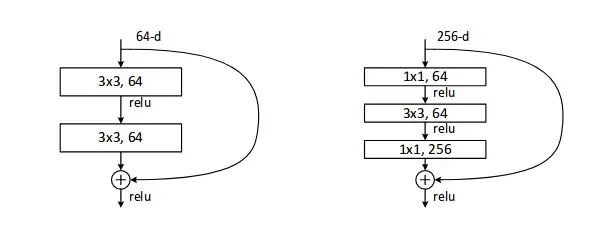

  **ResNet-50** is a 50-layer convolutional neural network (48 convolutional layers, one MaxPool layer, and one average pool layer). [link](https://datagen.tech/guides/computer-vision/resnet-50/)

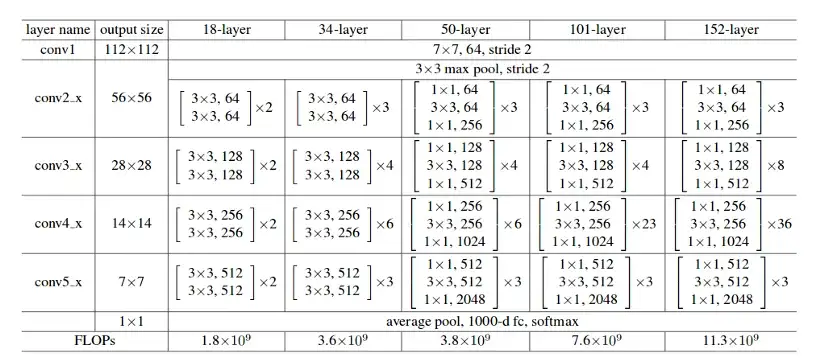

In [67]:
train_generator = train_gen.flow_from_directory(
    batch_size= 4,
    directory = train_dir,
    shuffle= True,
    target_size = (256,256),
    class_mode = 'categorical',
    subset = 'training'
)
validation_generator = train_gen.flow_from_directory(
    batch_size=4,
    directory= train_dir,
    shuffle= True,
    target_size= (256,256),
    class_mode = 'categorical',
    subset = 'validation'
)
test_generator = test_gen.flow_from_directory(
    batch_size=4,
    directory= test_dir,
    shuffle= True,
    target_size=(256,256),
    class_mode= 'categorical'
)

Found 428 images belonging to 4 classes.
Found 104 images belonging to 4 classes.
Found 40 images belonging to 4 classes.


In [149]:
# how many layers are in the model
print("Number of layers in the ResNet50 model: ", len(basemodel.layers))

Number of layers in the ResNet50 model:  175


In [39]:
# creating ResNet50
basemodel= ResNet50(weights='imagenet', include_top=False, input_tensor= Input(shape=(256,256,3)))
# # freeze all layers except the last 10
for layer in basemodel.layers[:-10]:
    layer.trainable = False

basemodel.summary()

Model: "resnet50"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 262, 262, 3)  0           ['input_1[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 128, 128, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                                                                                           

                                                                                                  
 conv2_block3_1_relu (Activatio  (None, 64, 64, 64)  0           ['conv2_block3_1_bn[0][0]']      
 n)                                                                                               
                                                                                                  
 conv2_block3_2_conv (Conv2D)   (None, 64, 64, 64)   36928       ['conv2_block3_1_relu[0][0]']    
                                                                                                  
 conv2_block3_2_bn (BatchNormal  (None, 64, 64, 64)  256         ['conv2_block3_2_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 conv2_block3_2_relu (Activatio  (None, 64, 64, 64)  0           ['conv2_block3_2_bn[0][0]']      
 n)       

                                                                                                  
 conv3_block3_1_relu (Activatio  (None, 32, 32, 128)  0          ['conv3_block3_1_bn[0][0]']      
 n)                                                                                               
                                                                                                  
 conv3_block3_2_conv (Conv2D)   (None, 32, 32, 128)  147584      ['conv3_block3_1_relu[0][0]']    
                                                                                                  
 conv3_block3_2_bn (BatchNormal  (None, 32, 32, 128)  512        ['conv3_block3_2_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 conv3_block3_2_relu (Activatio  (None, 32, 32, 128)  0          ['conv3_block3_2_bn[0][0]']      
 n)       

                                                                                                  
 conv4_block2_1_bn (BatchNormal  (None, 16, 16, 256)  1024       ['conv4_block2_1_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 conv4_block2_1_relu (Activatio  (None, 16, 16, 256)  0          ['conv4_block2_1_bn[0][0]']      
 n)                                                                                               
                                                                                                  
 conv4_block2_2_conv (Conv2D)   (None, 16, 16, 256)  590080      ['conv4_block2_1_relu[0][0]']    
                                                                                                  
 conv4_block2_2_bn (BatchNormal  (None, 16, 16, 256)  1024       ['conv4_block2_2_conv[0][0]']    
 ization) 

 conv4_block5_1_conv (Conv2D)   (None, 16, 16, 256)  262400      ['conv4_block4_out[0][0]']       
                                                                                                  
 conv4_block5_1_bn (BatchNormal  (None, 16, 16, 256)  1024       ['conv4_block5_1_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 conv4_block5_1_relu (Activatio  (None, 16, 16, 256)  0          ['conv4_block5_1_bn[0][0]']      
 n)                                                                                               
                                                                                                  
 conv4_block5_2_conv (Conv2D)   (None, 16, 16, 256)  590080      ['conv4_block5_1_relu[0][0]']    
                                                                                                  
 conv4_blo

                                                                  'conv5_block1_3_bn[0][0]']      
                                                                                                  
 conv5_block1_out (Activation)  (None, 8, 8, 2048)   0           ['conv5_block1_add[0][0]']       
                                                                                                  
 conv5_block2_1_conv (Conv2D)   (None, 8, 8, 512)    1049088     ['conv5_block1_out[0][0]']       
                                                                                                  
 conv5_block2_1_bn (BatchNormal  (None, 8, 8, 512)   2048        ['conv5_block2_1_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 conv5_block2_1_relu (Activatio  (None, 8, 8, 512)   0           ['conv5_block2_1_bn[0][0]']      
 n)       

In [40]:
headmodel = basemodel.output
headmodel = AveragePooling2D(pool_size=(4,4))(headmodel)
headmodel = Flatten(name= 'flatten')(headmodel)
 # fully connected layer
headmodel = Dense(256, activation= 'relu')(headmodel)
headmodel = Dropout(0.3)(headmodel)
headmodel = Dense(160, activation='relu')(headmodel)
headmodel = Dropout(0.2)(headmodel)
headmodel = Dense(58, activation= 'relu')(headmodel)
headmodel = Dropout(0.5)(headmodel)
headmodel = Dense(4, activation= 'softmax')(headmodel)
# creating the final model
model_resnet = Model(inputs= basemodel.input, outputs = headmodel)
# compile the model
model_resnet.compile(
    loss = 'categorical_crossentropy',
    optimizer = optimizers.RMSprop(learning_rate= 0.00001, decay= 0.00001),
    metrics = ['accuracy']
)

In [41]:
# checkpointer to monitor accuracy and preventing overfit
earlystopping = EarlyStopping(
    monitor = 'val_loss',
    mode = 'min',
    verbose = 1,
    patience = 20
)
# save the weights
checkpointer = ModelCheckpoint(
    filepath = 'resnet1.hdf5',
    verbose = 1,
    save_best_only = True
)

In [42]:
%%time
# we start to train model
history_resnet = model_resnet.fit(
    train_generator,
    steps_per_epoch = train_generator.n // 4,
    epochs = 100,
    validation_data = validation_generator,
    validation_steps = validation_generator.n // 4,
    callbacks = [earlystopping, checkpointer]
)

Epoch 1/100
107/107 [==============================] - ETA: 0s - loss: 1.4913 - accuracy: 0.2570
Epoch 1: val_loss improved from inf to 1.39047, saving model to resnet1.hdf5
107/107 [==============================] - 55s 468ms/step - loss: 1.4913 - accuracy: 0.2570 - val_loss: 1.3905 - val_accuracy: 0.2404
Epoch 2/100
107/107 [==============================] - ETA: 0s - loss: 1.3507 - accuracy: 0.3341
Epoch 2: val_loss improved from 1.39047 to 1.34574, saving model to resnet1.hdf5
107/107 [==============================] - 50s 470ms/step - loss: 1.3507 - accuracy: 0.3341 - val_loss: 1.3457 - val_accuracy: 0.2692
Epoch 3/100
107/107 [==============================] - ETA: 0s - loss: 1.2213 - accuracy: 0.4509
Epoch 3: val_loss improved from 1.34574 to 1.27642, saving model to resnet1.hdf5
107/107 [==============================] - 53s 494ms/step - loss: 1.2213 - accuracy: 0.4509 - val_loss: 1.2764 - val_accuracy: 0.4423
Epoch 4/100
107/107 [==============================] - ETA: 0s - los

Epoch 28/100
107/107 [==============================] - ETA: 0s - loss: 0.5462 - accuracy: 0.7967
Epoch 28: val_loss improved from 0.60596 to 0.58692, saving model to resnet1.hdf5
107/107 [==============================] - 52s 486ms/step - loss: 0.5462 - accuracy: 0.7967 - val_loss: 0.5869 - val_accuracy: 0.7692
Epoch 29/100
107/107 [==============================] - ETA: 0s - loss: 0.5010 - accuracy: 0.8294
Epoch 29: val_loss improved from 0.58692 to 0.54261, saving model to resnet1.hdf5
107/107 [==============================] - 52s 484ms/step - loss: 0.5010 - accuracy: 0.8294 - val_loss: 0.5426 - val_accuracy: 0.8077
Epoch 30/100
107/107 [==============================] - ETA: 0s - loss: 0.5433 - accuracy: 0.8107
Epoch 30: val_loss did not improve from 0.54261
107/107 [==============================] - 51s 480ms/step - loss: 0.5433 - accuracy: 0.8107 - val_loss: 0.5583 - val_accuracy: 0.7981
Epoch 31/100
107/107 [==============================] - ETA: 0s - loss: 0.5361 - accuracy: 0

Epoch 57/100
107/107 [==============================] - ETA: 0s - loss: 0.3082 - accuracy: 0.9019
Epoch 57: val_loss did not improve from 0.47789
107/107 [==============================] - 51s 478ms/step - loss: 0.3082 - accuracy: 0.9019 - val_loss: 0.5270 - val_accuracy: 0.8173
Epoch 58/100
107/107 [==============================] - ETA: 0s - loss: 0.2945 - accuracy: 0.9089
Epoch 58: val_loss did not improve from 0.47789
107/107 [==============================] - 51s 481ms/step - loss: 0.2945 - accuracy: 0.9089 - val_loss: 0.5975 - val_accuracy: 0.8077
Epoch 59/100
107/107 [==============================] - ETA: 0s - loss: 0.3428 - accuracy: 0.8995
Epoch 59: val_loss did not improve from 0.47789
107/107 [==============================] - 51s 479ms/step - loss: 0.3428 - accuracy: 0.8995 - val_loss: 0.5393 - val_accuracy: 0.8269
Epoch 60/100
107/107 [==============================] - ETA: 0s - loss: 0.3081 - accuracy: 0.9089
Epoch 60: val_loss did not improve from 0.47789
107/107 [=====

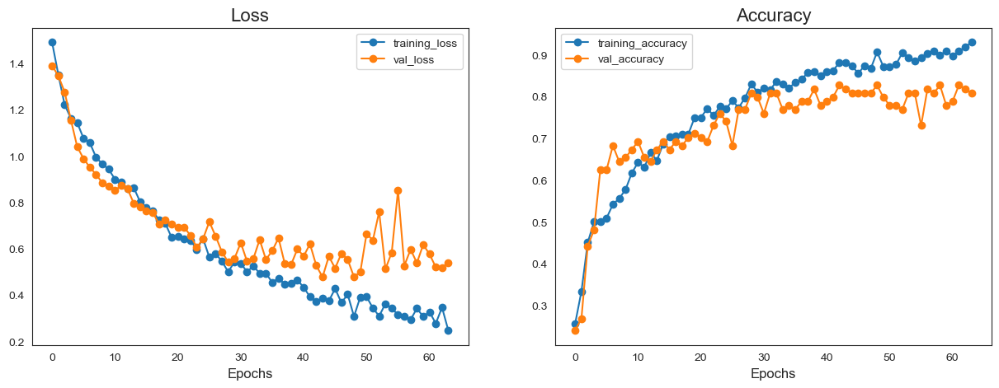

In [43]:
# visualize loss and accuracy history
history_plot(history_resnet)

 We observe overfitting after 31 epoch on the training set.

In [68]:
# model evaluation
evaluate_resnet = model_resnet.evaluate(test_generator, steps= test_generator.n//4, verbose=1)
print('Accuracy test{}'.format(evaluate_resnet[1]))
model_resnet.save('X-ray_resnet.h5')

10/10 [==============================] - 3s 303ms/step - loss: 65.1361 - accuracy: 0.2500
Accuracy test0.25


In [69]:
# generate model predictions
prediction_resnet=[]
original_resnet= []
image= []

for i in range(len(os.listdir(test_dir))):
    for item in os.listdir(os.path.join(test_dir, str(i))):
        img = cv2.imread(os.path.join(test_dir, str(i), item))
        img = cv2.resize(img, (256,256))
        image.append(img)

        img = img /255
        img = img.reshape(-1,256,256,3)

        predict = model_resnet.predict(img)
        predict = np.argmax(predict)
        prediction_resnet.append(predict)
        original_resnet.append(i)

1/1 [==============================] - 0s 112ms/step


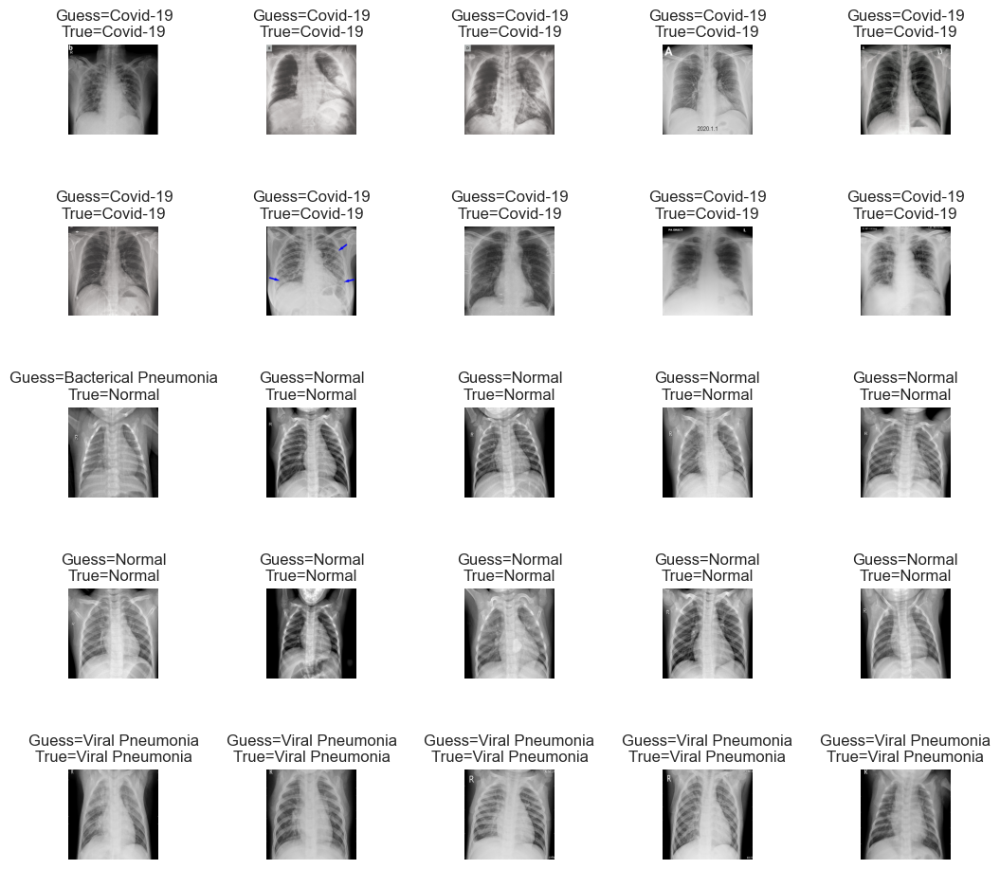

In [70]:
# plot the images and check with results
predictive_plot(prediction_resnet, original_resnet)

We took 25 random images to predict the model, and only once the model was wrong.

              precision    recall  f1-score   support

           0       0.83      1.00      0.91        10
           1       0.69      0.90      0.78        10
           2       0.83      0.50      0.62        10
           3       0.78      0.70      0.74        10

    accuracy                           0.78        40
   macro avg       0.78      0.77      0.76        40
weighted avg       0.78      0.78      0.76        40

****************************************************************************************************
Test accuracy: 0.775
****************************************************************************************************


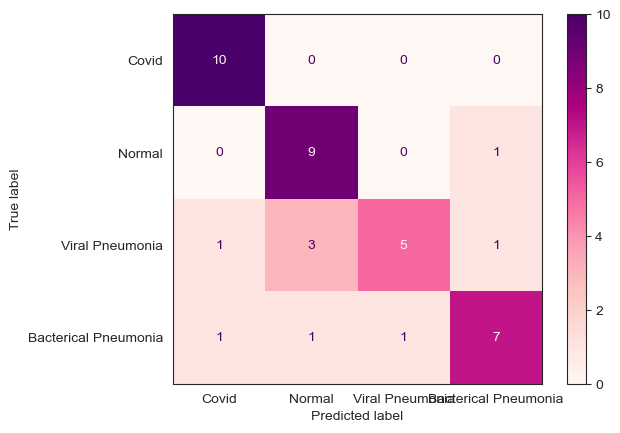

<Figure size 1000x1000 with 0 Axes>

In [71]:
# let's have a look at the classification report and confution matrix
metrics(np.asarray(original_resnet), np.asarray(prediction_resnet))

## VGG19 model building

VGG is a deep CNN used to classify images. The layers in the VGG19 model are as follows:
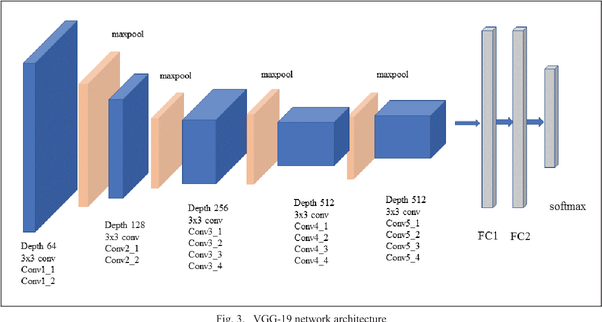
VGG-19 is a convolutional neural network that is trained on more than a million images from the ImageNet database. The network is 19 layers deep and can classify images into 1000 object categories. [link](https://freenext.com/vgg-19-convolutional-neural-network/)

In [150]:
# how many layers are in the model
print("Number of layers in the VGG19 model: ", len(basemodel_vgg19_1.layers))

Number of layers in the VGG19 model:  22


In [180]:
# creating VGG19
basemodel_vgg19_1 = VGG19(weights = "imagenet", include_top = False, input_shape = (256, 256, 3))

# freeze all layers except the last 3
for layer in basemodel_vgg19_1.layers[:-3]:
    layer.trainable = False

basemodel_vgg19_1.summary()

Model: "vgg19"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_7 (InputLayer)        [(None, 256, 256, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 256, 256, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 256, 256, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 128, 128, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 128, 128, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 128, 128, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 64, 64, 128)       0     

In [181]:
headmodel_vgg1 = basemodel_vgg19_1.output
headmodel_vgg1 = AveragePooling2D(pool_size=(3,3))(headmodel_vgg1)
headmodel_vgg1 = Flatten(name= 'flatten')(headmodel_vgg1)
 # fully connected layer
headmodel_vgg1 = Dense(128, activation= 'relu')(headmodel_vgg1)
headmodel_vgg1 = Dropout(0.2)(headmodel_vgg1)
headmodel_vgg1 = Dense(32, activation= 'relu')(headmodel_vgg1)
headmodel_vgg1 = Dropout(0.9)(headmodel_vgg1)
headmodel_vgg1 = Dense(4, activation= 'softmax')(headmodel_vgg1)
# creating the final model 
model_vgg19_1 = Model(inputs= basemodel_vgg19_1.input, outputs = headmodel_vgg1)
# compile the model
model_vgg19_1.compile(
    loss = 'categorical_crossentropy',
    optimizer = 'adam',
    metrics = ['accuracy']
)

In [182]:
# checkpointer to monitor accuracy and preventing overfit
earlystopping = EarlyStopping(
    monitor = 'val_loss',
    mode = 'min',
    verbose = 1,
    patience = 20
)
# save the weights
checkpointer = ModelCheckpoint(
    filepath = 'vgg19_1.hdf5',
    verbose = 1,
    save_best_only = True
)

In [183]:
%%time
# we start to train model
history_vgg19_1 = model_vgg19_1.fit(
    train_generator,
    epochs = 100,
    validation_data = validation_generator,
    callbacks = [earlystopping, checkpointer]
)

Epoch 1/100
11/11 [==============================] - ETA: 0s - loss: 1.7340 - accuracy: 0.2523
Epoch 1: val_loss improved from inf to 1.33311, saving model to vgg19_1.hdf5
11/11 [==============================] - 103s 9s/step - loss: 1.7340 - accuracy: 0.2523 - val_loss: 1.3331 - val_accuracy: 0.2885
Epoch 2/100
11/11 [==============================] - ETA: 0s - loss: 1.3933 - accuracy: 0.2804
Epoch 2: val_loss improved from 1.33311 to 1.33144, saving model to vgg19_1.hdf5
11/11 [==============================] - 119s 11s/step - loss: 1.3933 - accuracy: 0.2804 - val_loss: 1.3314 - val_accuracy: 0.3750
Epoch 3/100
11/11 [==============================] - ETA: 0s - loss: 1.3582 - accuracy: 0.2687
Epoch 3: val_loss improved from 1.33144 to 1.29389, saving model to vgg19_1.hdf5
11/11 [==============================] - 124s 11s/step - loss: 1.3582 - accuracy: 0.2687 - val_loss: 1.2939 - val_accuracy: 0.4231
Epoch 4/100
11/11 [==============================] - ETA: 0s - loss: 1.3420 - accura

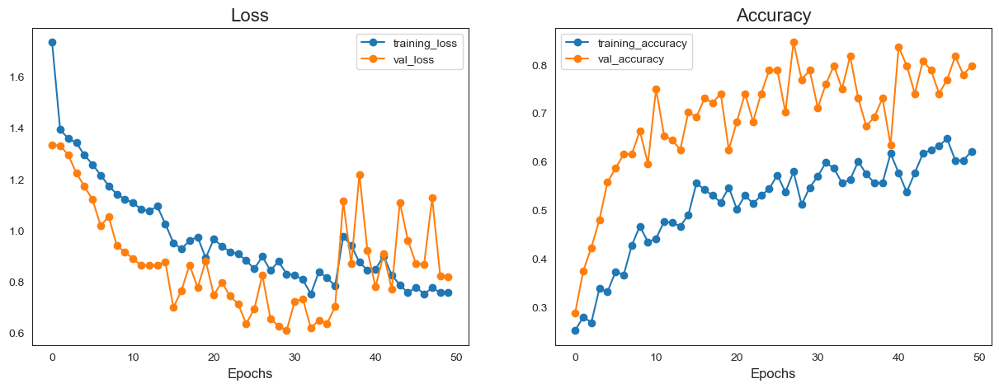

In [184]:
# visualize loss and accuracy history
history_plot(history_vgg19_1)

 We observe underfitting on the training set.

In [185]:
# model evaluation
evaluate_vgg19_1 = model_vgg19_1.evaluate(test_generator, steps= test_generator.n//10, verbose=1)
print('Accuracy test{}'.format(evaluate_vgg19_1[1]))
model_vgg19_1.save('X-ray_vgg19_1.h5')

4/4 [==============================] - 8s 2s/step - loss: 9.6165 - accuracy: 0.5000
Accuracy test0.5


In [186]:
# generate model predictions
prediction_vgg19_1=[]
original_vgg19_1= []
image= []

for i in range(len(os.listdir(test_dir))):
    for item in os.listdir(os.path.join(test_dir, str(i))):
        img = cv2.imread(os.path.join(test_dir, str(i), item))
        img = cv2.resize(img, (256,256))
        image.append(img)

        img = img /255
        img = img.reshape(-1,256,256,3)

        predict = model_vgg19_1.predict(img)
        predict = np.argmax(predict)
        prediction_vgg19_1.append(predict)
        original_vgg19_1.append(i)

1/1 [==============================] - 0s 281ms/step


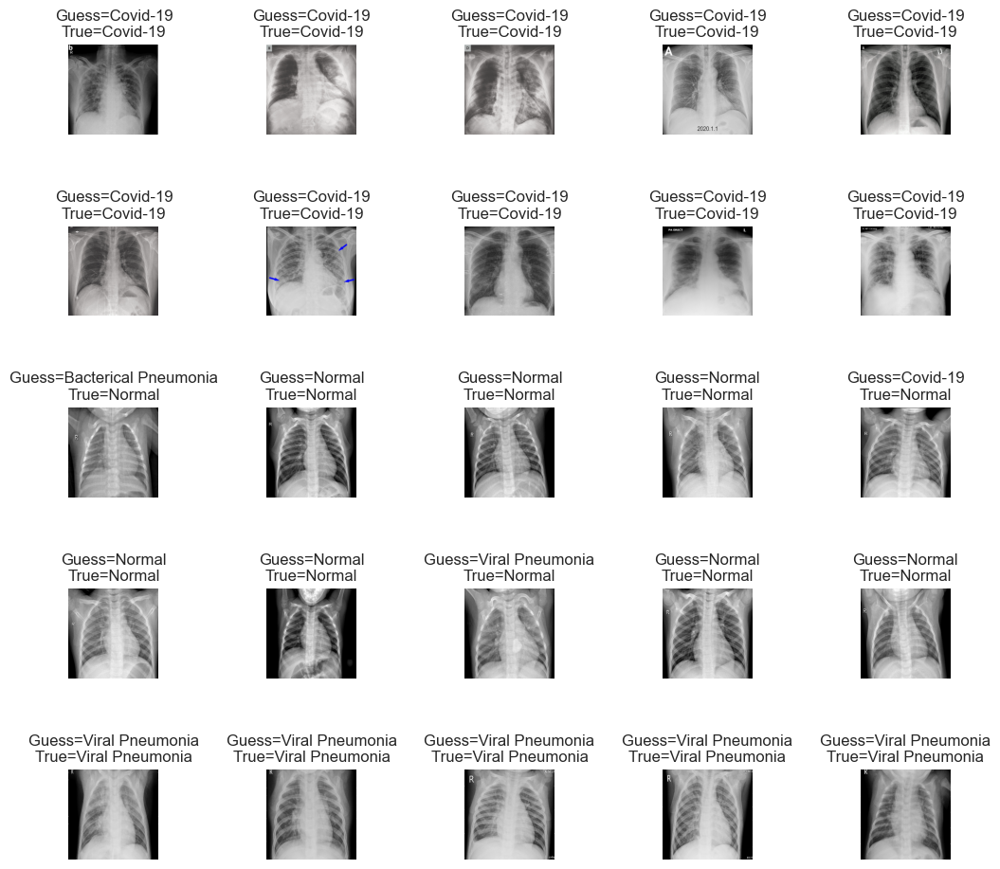

In [187]:
# plot the images and check with results
predictive_plot(prediction_vgg19_1, original_vgg19_1)

We took 25 random images to predict the model, and 3 times the model was wrong.

              precision    recall  f1-score   support

           0       0.83      1.00      0.91        10
           1       0.78      0.70      0.74        10
           2       0.75      0.60      0.67        10
           3       0.73      0.80      0.76        10

    accuracy                           0.78        40
   macro avg       0.77      0.77      0.77        40
weighted avg       0.77      0.78      0.77        40

****************************************************************************************************
Test accuracy: 0.775
****************************************************************************************************


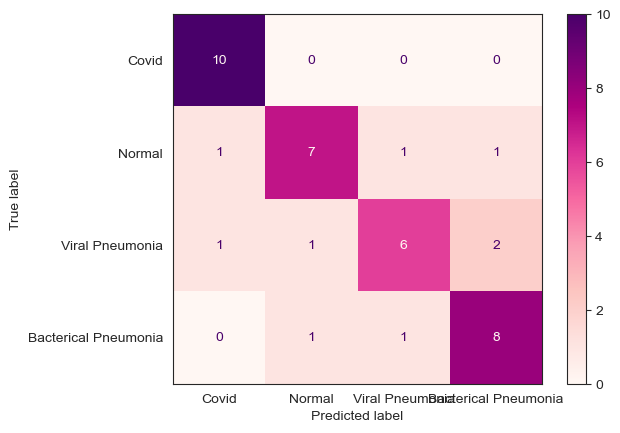

<Figure size 1000x1000 with 0 Axes>

In [188]:
# let's have a look at the classification report and confution matrix
metrics(np.asarray(original_vgg19_1), np.asarray(prediction_vgg19_1))

## VGG16 model building

VGG16 refers to the VGG model, also called VGGNet. It is a convolution neural network (CNN) model supporting 16 layers. K. Simonyan and A. Zisserman from Oxford University proposed this model and published it in a paper called "Very Deep Convolutional Networks for Large-Scale Image Recognition".

The VGGNet architecture incorporates the most important convolution neural network features. [link](https://datagen.tech/guides/computer-vision/vgg16/)
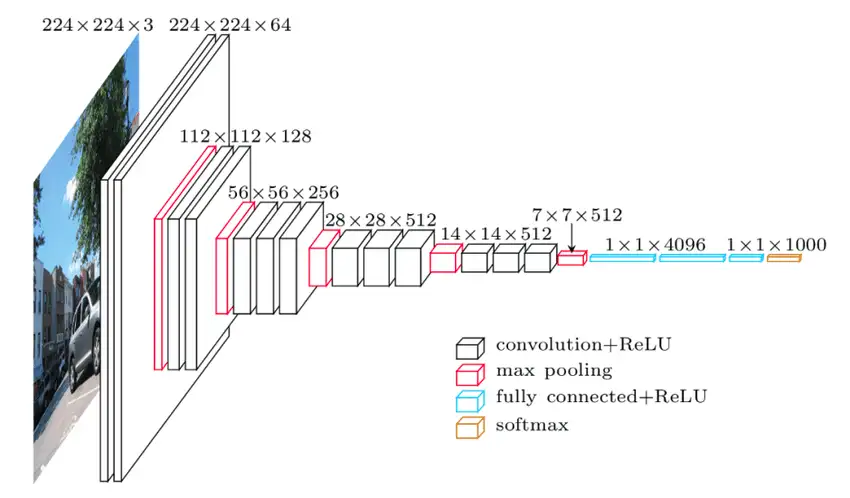

In [202]:
# how many layers are in the model
print("Number of layers in the VGG16 model: ", len(basemodel_vgg16.layers))

Number of layers in the VGG16 model:  19


In [212]:
# creating VGG16
basemodel_vgg16 = VGG16(weights = "imagenet", include_top = False, input_shape = (256, 256, 3))
# freeze all layers except the last 3
for layer in basemodel_vgg16.layers[:-3]:
    layer.trainable = False

basemodel_vgg16.summary()

Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_11 (InputLayer)       [(None, 256, 256, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 256, 256, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 256, 256, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 128, 128, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 128, 128, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 128, 128, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 64, 64, 128)       0     

In [213]:
headmodel_vgg16 = basemodel_vgg16.output
headmodel_vgg16 = MaxPool2D(pool_size=(3,3))(headmodel_vgg16)
headmodel_vgg16 = Flatten(name= 'flatten')(headmodel_vgg16)
# fully connected layer
headmodel_vgg16 = Dense(64, activation='relu')(headmodel_vgg16)
headmodel_vgg16 = Dropout(0.2)(headmodel_vgg16)
headmodel_vgg16 = Dense(15, activation= 'relu')(headmodel_vgg16)
headmodel_vgg16 = Dropout(0.6)(headmodel_vgg16)
headmodel_vgg16 = Dense(4, activation= 'softmax')(headmodel_vgg16)
# creating the final model 
model_vgg16 = Model(inputs= basemodel_vgg16.input, outputs = headmodel_vgg16)
# compile the model
model_vgg16.compile(
    loss = 'categorical_crossentropy',
    optimizer = 'adagrad',
    metrics = ['accuracy']
)

In [214]:
# checkpointer to monitor accuracy and preventing overfit
earlystopping = EarlyStopping(
    monitor = 'val_loss',
    mode = 'min',
    verbose = 1,
    patience = 20
)
# save the weights
checkpointer = ModelCheckpoint(
    filepath = 'vgg16.hdf5',
    verbose = 1,
    save_best_only = True
)

In [215]:
%%time
# we start to train our model
history_vgg16 = model_vgg16.fit(
    train_generator,
    epochs = 100,
    validation_data = validation_generator,
    batch_size=20,
    callbacks = [earlystopping, checkpointer]
)

Epoch 1/100
11/11 [==============================] - ETA: 0s - loss: 1.6059 - accuracy: 0.2570
Epoch 1: val_loss improved from inf to 1.36410, saving model to vgg16.hdf5
11/11 [==============================] - 84s 8s/step - loss: 1.6059 - accuracy: 0.2570 - val_loss: 1.3641 - val_accuracy: 0.3077
Epoch 2/100
11/11 [==============================] - ETA: 0s - loss: 1.3603 - accuracy: 0.2547
Epoch 2: val_loss improved from 1.36410 to 1.30958, saving model to vgg16.hdf5
11/11 [==============================] - 82s 8s/step - loss: 1.3603 - accuracy: 0.2547 - val_loss: 1.3096 - val_accuracy: 0.4904
Epoch 3/100
11/11 [==============================] - ETA: 0s - loss: 1.2583 - accuracy: 0.3832
Epoch 3: val_loss improved from 1.30958 to 1.23441, saving model to vgg16.hdf5
11/11 [==============================] - 92s 9s/step - loss: 1.2583 - accuracy: 0.3832 - val_loss: 1.2344 - val_accuracy: 0.5577
Epoch 4/100
11/11 [==============================] - ETA: 0s - loss: 1.2230 - accuracy: 0.3995


11/11 [==============================] - 97s 9s/step - loss: 0.7717 - accuracy: 0.6449 - val_loss: 0.6487 - val_accuracy: 0.8269
Epoch 29/100
11/11 [==============================] - ETA: 0s - loss: 0.7284 - accuracy: 0.6846
Epoch 29: val_loss did not improve from 0.64682
11/11 [==============================] - 98s 9s/step - loss: 0.7284 - accuracy: 0.6846 - val_loss: 0.6711 - val_accuracy: 0.7885
Epoch 30/100
11/11 [==============================] - ETA: 0s - loss: 0.7390 - accuracy: 0.6846
Epoch 30: val_loss improved from 0.64682 to 0.60548, saving model to vgg16.hdf5
11/11 [==============================] - 96s 9s/step - loss: 0.7390 - accuracy: 0.6846 - val_loss: 0.6055 - val_accuracy: 0.8462
Epoch 31/100
11/11 [==============================] - ETA: 0s - loss: 0.7329 - accuracy: 0.6869
Epoch 31: val_loss did not improve from 0.60548
11/11 [==============================] - 97s 9s/step - loss: 0.7329 - accuracy: 0.6869 - val_loss: 0.6174 - val_accuracy: 0.8365
Epoch 32/100
11/11 [

Epoch 57/100
11/11 [==============================] - ETA: 0s - loss: 0.5680 - accuracy: 0.7664
Epoch 57: val_loss did not improve from 0.49464
11/11 [==============================] - 99s 9s/step - loss: 0.5680 - accuracy: 0.7664 - val_loss: 0.5198 - val_accuracy: 0.7981
Epoch 58/100
11/11 [==============================] - ETA: 0s - loss: 0.6143 - accuracy: 0.7126
Epoch 58: val_loss did not improve from 0.49464
11/11 [==============================] - 96s 9s/step - loss: 0.6143 - accuracy: 0.7126 - val_loss: 0.4965 - val_accuracy: 0.8365
Epoch 59/100
11/11 [==============================] - ETA: 0s - loss: 0.5457 - accuracy: 0.7687
Epoch 59: val_loss did not improve from 0.49464
11/11 [==============================] - 99s 9s/step - loss: 0.5457 - accuracy: 0.7687 - val_loss: 0.4974 - val_accuracy: 0.8365
Epoch 60/100
11/11 [==============================] - ETA: 0s - loss: 0.5567 - accuracy: 0.7640
Epoch 60: val_loss improved from 0.49464 to 0.49000, saving model to vgg16.hdf5
11/11

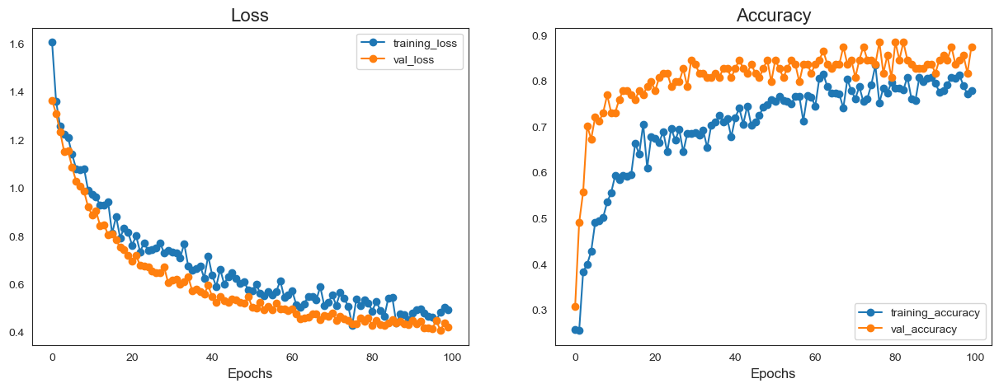

In [216]:
# visualize loss and accuracy history
history_plot(history_vgg16)

 We observe model underfitting on the training set.

In [217]:
# model evaluation
evaluate_vgg16 = model_vgg16.evaluate(test_generator, steps= test_generator.n//10, verbose=1)
print('Accuracy test{}'.format(evaluate_vgg16[1]))
model_vgg16.save('X-ray_vgg16.h5')

4/4 [==============================] - 7s 2s/step - loss: 2.5332 - accuracy: 0.5750
Accuracy test0.574999988079071


In [218]:
# generate model predictions
prediction_vgg16=[]
original_vgg16= []
image= []

for i in range(len(os.listdir(test_dir))):
    for item in os.listdir(os.path.join(test_dir, str(i))):
        img = cv2.imread(os.path.join(test_dir, str(i), item))
        img = cv2.resize(img, (256,256))
        image.append(img)

        img = img /255
        img = img.reshape(-1,256,256,3)

        predict = model_vgg16.predict(img)
        predict = np.argmax(predict)
        prediction_vgg16.append(predict)
        original_vgg16.append(i)

1/1 [==============================] - 0s 180ms/step


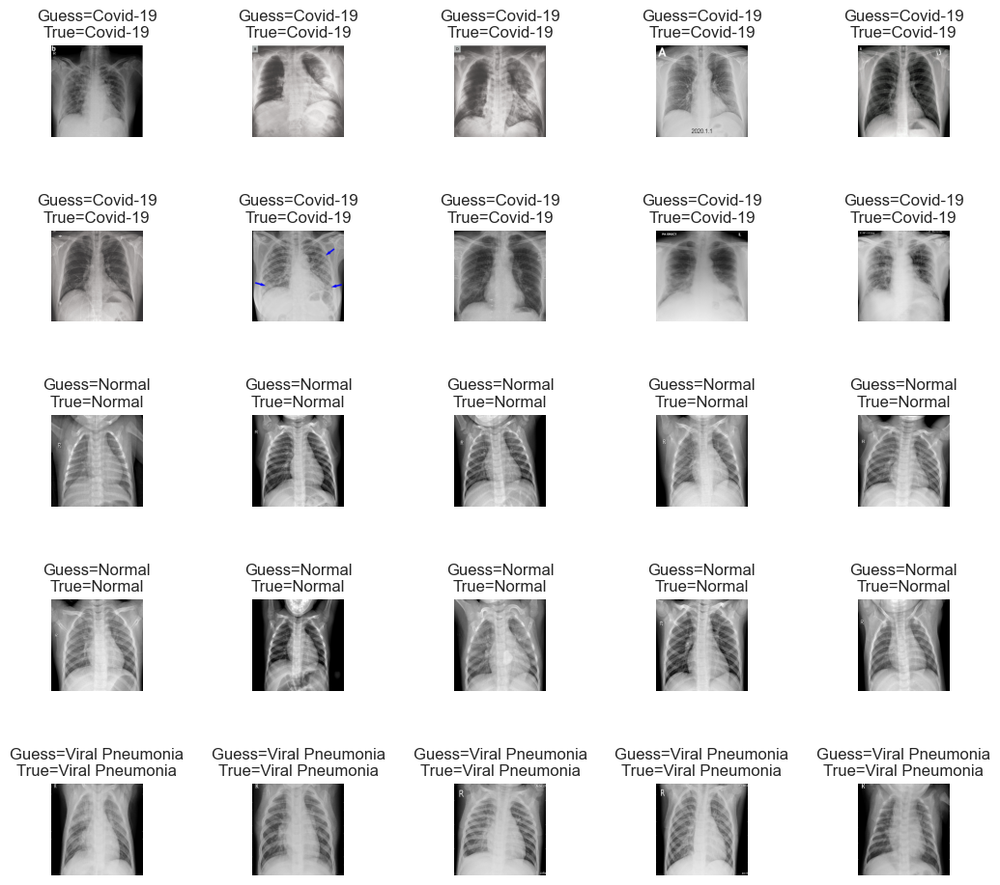

In [219]:
# plot the images and check with results
predictive_plot(prediction_vgg16, original_vgg16)

We took 25 random images to predict the model, never made a mistake.

              precision    recall  f1-score   support

           0       0.91      1.00      0.95        10
           1       0.67      1.00      0.80        10
           2       1.00      0.50      0.67        10
           3       0.89      0.80      0.84        10

    accuracy                           0.82        40
   macro avg       0.87      0.82      0.82        40
weighted avg       0.87      0.82      0.82        40

****************************************************************************************************
Test accuracy: 0.825
****************************************************************************************************


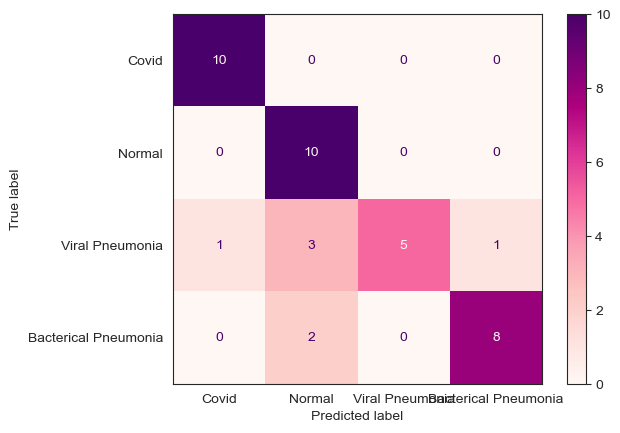

<Figure size 1000x1000 with 0 Axes>

In [220]:
# let's have a look at the classification report and confution matrix
metrics(np.asarray(original_vgg16), np.asarray(prediction_vgg16))

## Record Classification Metrics

In [338]:
# let's record the classification metrics from the report for each model.
def generate_scores(y_true, y_pred):
    
    model_accuracy = round(accuracy_score(y_true, y_pred), 4)
    model_precision, model_recall, model_f1, _ = precision_recall_fscore_support(y_true, y_pred, average="weighted")

    preformance_scores = {
        'accuracy_score': model_accuracy,
        'precision_score': model_precision,
        'recall_score': model_recall,
        'f1_score': model_f1,
    }
    return preformance_scores

In [339]:
# with generate_scores function evaluate models
cnn_1_performance = generate_scores(original_cnn_1, prediction_cnn_1)
cnn_2_performance = generate_scores(original_cnn_2, prediction_cnn_2)
resnet_performance = generate_scores(original_resnet, prediction_resnet)
vgg19_performance = generate_scores(original_vgg19_1, prediction_vgg19_1)
vgg16_performance = generate_scores(original_vgg16, prediction_vgg16)

In [340]:
# call columns in DataFrame
performace_df = pd.DataFrame({
    'CNN_1v': cnn_1_performance,
    'CNN_2v': cnn_2_performance,
    'ResNet50': resnet_performance,
    'VGG19': vgg19_performance,
    'VGG16': vgg16_performance,
}).T
performace_df

,accuracy_score,precision_score,recall_score,f1_score
CNN_1v,0.825,0.837879,0.825,0.822441
CNN_2v,0.750,0.756410,0.750,0.731258
ResNet50,0.775,0.784188,0.775,0.763385
VGG19,0.775,0.772096,0.775,0.768626
VGG16,0.825,0.866162,0.825,0.815288


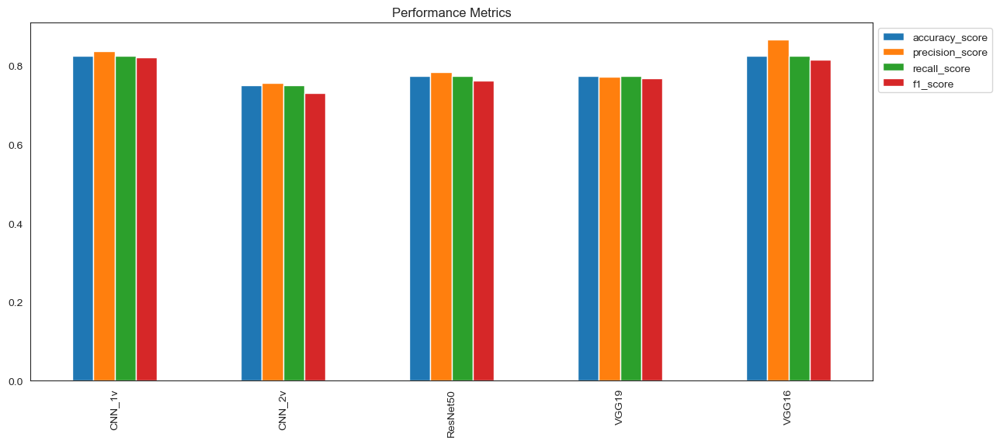

In [341]:
# visualization score
performace_df.plot(kind="bar", figsize=(14,6), title='Performance Metrics').legend(bbox_to_anchor=(1.0, 1.0))

The pre-trained model VGG16 showed the best result among other models

## Conclusion

 We tried to build a Convolutional Neural Networks (CNNs) along with Transfer Learning methods for detecting and classifying chest diseases from X-rays. 
* Trained CNN models and pre-trained models such as ResNet50, VGG-19, VGG-16 were used to create simple models, with different hyperparameters. We saved the trained models in the HF5 format.
* VGG16 model showed the best result with an accuracy of 82%, with small errors in the classification of pneumonia.
* The worst result was the basic CNN model (2nd version) with an accuracy of 75% with the Adamax optimizer.
* The models were good at defining covid but often misclassified pneumonias.